<a href="https://colab.research.google.com/github/naemililia/masterthesis/blob/main/finetune.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook will be used to finetune models on the senfloods handlabeled dataset

## Step 0: installs and imports

In [ ]:
!pip install rasterio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 68.5 MB/s eta 0:00:00


In [ ]:
!pip install segmentation-models-pytorch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 3.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 46.5 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_6

In [ ]:
# create a folder for model checkpoints

%cd /home
!sudo mkdir checkpoints

/home


In [ ]:
# connect drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import rasterio
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import os
import csv
import random
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from matplotlib import pyplot as plt
import segmentation_models_pytorch as smp
import torchvision.models as models
import torch.nn as nn
import torchvision.transforms.functional as F

## Load the handlabeled data

In [ ]:
# load their train test split of hand labeled

!gsutil cp gs://sen1floods11/v1.1/splits/flood_handlabeled/flood_train_data.csv .
!gsutil cp gs://sen1floods11/v1.1/splits/flood_handlabeled/flood_test_data.csv .
!gsutil cp gs://sen1floods11/v1.1/splits/flood_handlabeled/flood_valid_data.csv .

Copying gs://sen1floods11/v1.1/splits/flood_handlabeled/flood_train_data.csv...
- [1 files][ 13.3 KiB/ 13.3 KiB]                                                
Operation completed over 1 objects/13.3 KiB.                                     
Copying gs://sen1floods11/v1.1/splits/flood_handlabeled/flood_test_data.csv...
- [1 files][  4.7 KiB/  4.7 KiB]                                                
Operation completed over 1 objects/4.7 KiB.                                      
Copying gs://sen1floods11/v1.1/splits/flood_handlabeled/flood_valid_data.csv...
- [1 files][  4.7 KiB/  4.7 KiB]                                                
Operation completed over 1 objects/4.7 KiB.                                      


In [ ]:
# load their hand labeled data, as we will finetune on that data

!sudo mkdir files
!sudo mkdir files/S1
!sudo mkdir files/Labels

!gsutil -m rsync -r gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand files/S1
!gsutil -m rsync -r gs://sen1floods11/v1.1/data/flood_events/HandLabeled/LabelHand files/Labels


both the source and destination. Your crcmod installation isn't using the
module's C extension, so checksumming will run very slowly. If this is your
first rsync since updating gsutil, this rsync can take significantly longer than
usual. For help installing the extension, please see "gsutil help crcmod".

Building synchronization state...
Starting synchronization...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_103757_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_195474_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_290290_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_314919_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Bolivia_242570_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/HandLabeled/S1Hand/Ghana_141271_S1Hand.tif...
Copying gs://sen1floods11/v1.1/data/flood_events/H

### Create DataLoaders for the handlabeled data

this is copied from the baseline_senfloods.ipynb with the way the data and the labels need to be processed

In [ ]:
# load all the data
def getArrFlood(fname):
  return rasterio.open(fname).read()

def download_flood_water_data_from_list(l):
  i = 0
  tot_nan = 0
  tot_good = 0
  flood_data = []
  for (im_fname, mask_fname) in l:
    if not os.path.exists(os.path.join("files/", im_fname)):
      continue
    arr_x = np.nan_to_num(getArrFlood(os.path.join("files/", im_fname)))
    arr_y = getArrFlood(os.path.join("files/", mask_fname))
    arr_y[arr_y == -1] = 255

    arr_x = np.clip(arr_x, -50, 1)
    arr_x = (arr_x + 50) / 51

    if i % 100 == 0:
      print(im_fname, mask_fname)
    i += 1
    flood_data.append((arr_x,arr_y))

  return flood_data

def load_flood_train_data(input_root, label_root):
  fname = "flood_train_data.csv"
  training_files = []
  with open(fname) as f:
    for line in csv.reader(f):
      training_files.append(tuple((input_root+line[0], label_root+line[1])))

  return download_flood_water_data_from_list(training_files)

def load_flood_valid_data(input_root, label_root):
  fname = "flood_valid_data.csv"
  validation_files = []
  with open(fname) as f:
    for line in csv.reader(f):
      validation_files.append(tuple((input_root+line[0], label_root+line[1])))

  return download_flood_water_data_from_list(validation_files)

def load_flood_test_data(input_root, label_root):
  fname = "flood_test_data.csv"
  testing_files = []
  with open(fname) as f:
    for line in csv.reader(f):
      testing_files.append(tuple((input_root+line[0], label_root+line[1])))

  return download_flood_water_data_from_list(testing_files)

In [ ]:
# preprocess all the data

class InMemoryDataset(torch.utils.data.Dataset):

  def __init__(self, data_list, preprocess_func):
    self.data_list = data_list
    self.preprocess_func = preprocess_func

  def __getitem__(self, i):
    return self.preprocess_func(self.data_list[i])

  def __len__(self):
    return len(self.data_list)


def processAndAugment(data):
  (x,y) = data
  im,label = x.copy(), y.copy()

  # convert to PIL for easier transforms
  im1 = Image.fromarray(im[0])
  im2 = Image.fromarray(im[1])
  label = Image.fromarray(label.squeeze())

  # Get params for random transforms
  i, j, h, w = transforms.RandomCrop.get_params(im1, (256, 256))

  im1 = F.crop(im1, i, j, h, w)
  im2 = F.crop(im2, i, j, h, w)
  label = F.crop(label, i, j, h, w)
  if random.random() > 0.5:
    im1 = F.hflip(im1)
    im2 = F.hflip(im2)
    label = F.hflip(label)
  if random.random() > 0.5:
    im1 = F.vflip(im1)
    im2 = F.vflip(im2)
    label = F.vflip(label)

  norm = transforms.Normalize([0.6851, 0.5235], [0.0820, 0.1102])
  im = torch.stack([transforms.ToTensor()(im1).squeeze(), transforms.ToTensor()(im2).squeeze()])
  im = norm(im)
  label = transforms.ToTensor()(label).squeeze()
  if torch.sum(label.gt(.003) * label.lt(.004)):
    label *= 255
  label = label.round()

  return im, label


def processTestIm(data):
  (x,y) = data
  im,label = x.copy(), y.copy()
  norm = transforms.Normalize([0.6851, 0.5235], [0.0820, 0.1102])

  # convert to PIL for easier transforms
  im_c1 = Image.fromarray(im[0]).resize((512,512))
  im_c2 = Image.fromarray(im[1]).resize((512,512))
  label = Image.fromarray(label.squeeze()).resize((512,512))

  im_c1s = [F.crop(im_c1, 0, 0, 256, 256), F.crop(im_c1, 0, 256, 256, 256),
            F.crop(im_c1, 256, 0, 256, 256), F.crop(im_c1, 256, 256, 256, 256)]
  im_c2s = [F.crop(im_c2, 0, 0, 256, 256), F.crop(im_c2, 0, 256, 256, 256),
            F.crop(im_c2, 256, 0, 256, 256), F.crop(im_c2, 256, 256, 256, 256)]
  labels = [F.crop(label, 0, 0, 256, 256), F.crop(label, 0, 256, 256, 256),
            F.crop(label, 256, 0, 256, 256), F.crop(label, 256, 256, 256, 256)]

  ims = [torch.stack((transforms.ToTensor()(x).squeeze(),
                    transforms.ToTensor()(y).squeeze()))
                    for (x,y) in zip(im_c1s, im_c2s)]

  ims = [norm(im) for im in ims]
  ims = torch.stack(ims)

  labels = [(transforms.ToTensor()(label).squeeze()) for label in labels]
  labels = torch.stack(labels)

  if torch.sum(labels.gt(.003) * labels.lt(.004)):
    labels *= 255
  labels = labels.round()

  return ims, labels

In [ ]:
train_data = load_flood_train_data('S1/', 'Labels/')
train_dataset = InMemoryDataset(train_data, processAndAugment)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=16, shuffle=True, sampler=None,
                  batch_sampler=None, num_workers=0, collate_fn=None,
                  pin_memory=True, drop_last=False, timeout=0,
                  worker_init_fn=None)
train_iter = iter(train_loader)

valid_data = load_flood_valid_data('S1/', 'Labels/')
valid_dataset = InMemoryDataset(valid_data, processTestIm)
valid_loader = torch.utils.data.DataLoader(valid_dataset, batch_size=4, shuffle=True, sampler=None,
                  batch_sampler=None, num_workers=0, collate_fn=lambda x: (torch.cat([a[0] for a in x], 0), torch.cat([a[1] for a in x], 0)),
                  pin_memory=True, drop_last=False, timeout=0,
                  worker_init_fn=None)
valid_iter = iter(valid_loader)

S1/Ghana_103272_S1Hand.tif Labels/Ghana_103272_LabelHand.tif
S1/Pakistan_132143_S1Hand.tif Labels/Pakistan_132143_LabelHand.tif
S1/Sri-Lanka_916628_S1Hand.tif Labels/Sri-Lanka_916628_LabelHand.tif
S1/Ghana_5079_S1Hand.tif Labels/Ghana_5079_LabelHand.tif


In [ ]:
test_data = load_flood_test_data('S1/', 'Labels/')
test_dataset = InMemoryDataset(test_data, processTestIm)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=4, shuffle=True, sampler=None,
                  batch_sampler=None, num_workers=0, collate_fn=lambda x: (torch.cat([a[0] for a in x], 0), torch.cat([a[1] for a in x], 0)),
                  pin_memory=True, drop_last=False, timeout=0,
                  worker_init_fn=None)
test_iter = iter(test_loader)

## Define the model setup (pretext task)

for the pretext, this first needs to be of the same architecture like the model that I have trained my pretext task on.

In order to get this right, I need to determine which labels were used in the pretext model, and I will do this via a global variable

In [ ]:
LABELS_USED_IN_PRETEXT = ['BUILT'] # ['BUILT', 'LC'] / ['BUILT'] / ['POP'] / ['LC'] / ['BUILT', 'LC', 'POP']

In [ ]:
def convertBNtoGN(module, num_groups=16):
  """
  this was included from senfloods creators.
  possible explanation:
    GroupNorm was introduced as an alternative to BatchNorm, especially beneficial for cases where the batch size is small (in our case: 16).
    GroupNorm divides the channels into groups and computes the mean and standard deviation within these groups for normalization.
  """
  if isinstance(module, torch.nn.modules.batchnorm.BatchNorm2d):
    return nn.GroupNorm(num_groups, module.num_features,
                        eps=module.eps, affine=module.affine)
    if module.affine:
        mod.weight.data = module.weight.data.clone().detach()
        mod.bias.data = module.bias.data.clone().detach()

  for name, child in module.named_children():
      module.add_module(name, convertBNtoGN(child, num_groups=num_groups))

  return module

In [ ]:
# step 1: initialise the model with the same architecture as the pretrained one:

if len(LABELS_USED_IN_PRETEXT) == 3:
  net = smp.Unet(encoder_name="resnet18", encoder_weights=None, in_channels = 2, classes= 25)

elif len(LABELS_USED_IN_PRETEXT) == 2:
  net = smp.Unet(encoder_name="resnet18", encoder_weights=None, in_channels = 2, classes= 24) # in the 2 labels case we do not have the POP label, so only 24 output channels

elif LABELS_USED_IN_PRETEXT == ['BUILT'] or LABELS_USED_IN_PRETEXT == ['POP']:
  net = smp.Unet(encoder_name="resnet18", encoder_weights=None, in_channels = 2, classes= 6) # if we only use LC or POP

elif LABELS_USED_IN_PRETEXT == ['LC']:
  net = smp.Unet(encoder_name="resnet18", encoder_weights=None, in_channels = 2, classes= 18)



net_PT = convertBNtoGN(net)



In [ ]:
# this is to retrieve the weights from the pretrained model
model_save_path = '/content/drive/MyDrive/Uni/TUB/Semester/5 - Masterarbeit/models/pretext/'
checkpoints = os.listdir(model_save_path)
state_dict_PT = torch.load(model_save_path + 'pretext_BUILT_allData_test1_0.001BUILT_100_0.2735105198594408.cp') # load the LC model trained on all data after 200 iterations

state_dict_PT.keys()

odict_keys(['encoder.conv1.weight', 'encoder.bn1.weight', 'encoder.bn1.bias', 'encoder.layer1.0.conv1.weight', 'encoder.layer1.0.bn1.weight', 'encoder.layer1.0.bn1.bias', 'encoder.layer1.0.conv2.weight', 'encoder.layer1.0.bn2.weight', 'encoder.layer1.0.bn2.bias', 'encoder.layer1.1.conv1.weight', 'encoder.layer1.1.bn1.weight', 'encoder.layer1.1.bn1.bias', 'encoder.layer1.1.conv2.weight', 'encoder.layer1.1.bn2.weight', 'encoder.layer1.1.bn2.bias', 'encoder.layer2.0.conv1.weight', 'encoder.layer2.0.bn1.weight', 'encoder.layer2.0.bn1.bias', 'encoder.layer2.0.conv2.weight', 'encoder.layer2.0.bn2.weight', 'encoder.layer2.0.bn2.bias', 'encoder.layer2.0.downsample.0.weight', 'encoder.layer2.0.downsample.1.weight', 'encoder.layer2.0.downsample.1.bias', 'encoder.layer2.1.conv1.weight', 'encoder.layer2.1.bn1.weight', 'encoder.layer2.1.bn1.bias', 'encoder.layer2.1.conv2.weight', 'encoder.layer2.1.bn2.weight', 'encoder.layer2.1.bn2.bias', 'encoder.layer3.0.conv1.weight', 'encoder.layer3.0.bn1.weigh

In [ ]:
# get only the encoder weights, not the decoder or segmentation head ones
encoder_state_dict_test = {k.replace('encoder.', ''): v for k, v in state_dict_PT.items() if k.startswith('encoder.')}


In [ ]:
# load the state dict that was saved into there
net.encoder.load_state_dict(encoder_state_dict_test)

In [ ]:
# step 3: freeze the encoder (as I only want to keep the weights of that one, and adapt the decoder)
for param in net.encoder.parameters():
    param.requires_grad = False

In [ ]:
# step 4: adjust the last layer to now only have 2 outputs instead of 25:
net.segmentation_head[0] = torch.nn.modules.conv.Conv2d(16, 2, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

In [ ]:
LR = 5e-4


# step 5: define the optimizer, scheduler, and loss function
optimizer = torch.optim.AdamW(net.parameters(),lr=LR)

scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, len(train_loader) * 10, T_mult=2, eta_min=0, last_epoch=-1)

criterion = nn.CrossEntropyLoss(weight=torch.tensor([1,8]).float().cuda(), ignore_index=255) # copied straight from the Train.ipynb

#TODO: but this can be copied straight from train i think

## Contrastive learning model definition


model name (one where val_loss is lowest):
- CL_allData_BUILT_256_0001_74_64.27335119247437.cp
- CL_allData_BUILT_128_59_116.12763404846191.cp

In [ ]:
# create a model that will get the transferred encoder weights
# this is the correct structure immediately

net = smp.Unet(encoder_name="resnet18", encoder_weights=None, in_channels = 2, classes= 2)

In [ ]:
# this is to retrieve the state_dict from the pretrained model
model_save_path = '/content/drive/MyDrive/Uni/TUB/Semester/5 - Masterarbeit/models/contrastive_learning/'
checkpoints = os.listdir(model_save_path)
state_dict = torch.load(model_save_path + 'CL_allData_LC_256_0001_39_61.61464881896973.cp')

state_dict.keys()

odict_keys(['encoder_im1.conv1.weight', 'encoder_im1.bn1.weight', 'encoder_im1.bn1.bias', 'encoder_im1.bn1.running_mean', 'encoder_im1.bn1.running_var', 'encoder_im1.bn1.num_batches_tracked', 'encoder_im1.layer1.0.conv1.weight', 'encoder_im1.layer1.0.bn1.weight', 'encoder_im1.layer1.0.bn1.bias', 'encoder_im1.layer1.0.bn1.running_mean', 'encoder_im1.layer1.0.bn1.running_var', 'encoder_im1.layer1.0.bn1.num_batches_tracked', 'encoder_im1.layer1.0.conv2.weight', 'encoder_im1.layer1.0.bn2.weight', 'encoder_im1.layer1.0.bn2.bias', 'encoder_im1.layer1.0.bn2.running_mean', 'encoder_im1.layer1.0.bn2.running_var', 'encoder_im1.layer1.0.bn2.num_batches_tracked', 'encoder_im1.layer1.1.conv1.weight', 'encoder_im1.layer1.1.bn1.weight', 'encoder_im1.layer1.1.bn1.bias', 'encoder_im1.layer1.1.bn1.running_mean', 'encoder_im1.layer1.1.bn1.running_var', 'encoder_im1.layer1.1.bn1.num_batches_tracked', 'encoder_im1.layer1.1.conv2.weight', 'encoder_im1.layer1.1.bn2.weight', 'encoder_im1.layer1.1.bn2.bias', '

In [ ]:
# get only the encoder_im1 keys:
encoder_im1_state_dict = {k.replace('encoder_im1.', ''): v for k, v in state_dict.items() if k.startswith('encoder_im1.')}
encoder_im1_state_dict.keys()

dict_keys(['conv1.weight', 'bn1.weight', 'bn1.bias', 'bn1.running_mean', 'bn1.running_var', 'bn1.num_batches_tracked', 'layer1.0.conv1.weight', 'layer1.0.bn1.weight', 'layer1.0.bn1.bias', 'layer1.0.bn1.running_mean', 'layer1.0.bn1.running_var', 'layer1.0.bn1.num_batches_tracked', 'layer1.0.conv2.weight', 'layer1.0.bn2.weight', 'layer1.0.bn2.bias', 'layer1.0.bn2.running_mean', 'layer1.0.bn2.running_var', 'layer1.0.bn2.num_batches_tracked', 'layer1.1.conv1.weight', 'layer1.1.bn1.weight', 'layer1.1.bn1.bias', 'layer1.1.bn1.running_mean', 'layer1.1.bn1.running_var', 'layer1.1.bn1.num_batches_tracked', 'layer1.1.conv2.weight', 'layer1.1.bn2.weight', 'layer1.1.bn2.bias', 'layer1.1.bn2.running_mean', 'layer1.1.bn2.running_var', 'layer1.1.bn2.num_batches_tracked', 'layer2.0.conv1.weight', 'layer2.0.bn1.weight', 'layer2.0.bn1.bias', 'layer2.0.bn1.running_mean', 'layer2.0.bn1.running_var', 'layer2.0.bn1.num_batches_tracked', 'layer2.0.conv2.weight', 'layer2.0.bn2.weight', 'layer2.0.bn2.bias', 'l

In [ ]:
# transfer only the encoder weigts:

net.encoder.load_state_dict(encoder_im1_state_dict)

In [ ]:
# step 3: freeze the encoder (as I only want to keep the weights of that one, and adapt the decoder)
for param in net.encoder.parameters():
    param.requires_grad = False

In [ ]:
# we can only convert to groupnorm after we transferred the weights, because in CL we trained with BN

# need to check if this is correct
net = convertBNtoGN(net)

In [ ]:
LR = 5e-4


# step 5: define the optimizer, scheduler, and loss function
optimizer = torch.optim.AdamW(net.parameters(),lr=LR)

scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, len(train_loader) * 10, T_mult=2, eta_min=0, last_epoch=-1)

criterion = nn.CrossEntropyLoss(weight=torch.tensor([1,8]).float().cuda(), ignore_index=255) # copied straight from the Train.ipynb

## Define the training & validation schemes

TODO: this can probably also be copied straight from the Train.ipynb from teh authors as i am l

In [ ]:
# metrics to calculate here:

def computeIOU(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()

  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  intersection = torch.sum(output * target)
  union = torch.sum(target) + torch.sum(output) - intersection
  iou = (intersection + .0000001) / (union + .0000001)

  if iou != iou:
    print("failed, replacing with 0")
    iou = torch.tensor(0).float()

  return iou

def computeAccuracy(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()

  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  correct = torch.sum(output.eq(target))

  return correct.float() / len(target)

def truePositives(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()
  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  correct = torch.sum(output * target)

  return correct

def trueNegatives(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()
  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  output = (output == 0)
  target = (target == 0)
  correct = torch.sum(output * target)

  return correct

def falsePositives(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()
  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  output = (output == 1)
  target = (target == 0)
  correct = torch.sum(output * target)

  return correct

def falseNegatives(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()
  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  output = (output == 0)
  target = (target == 1)
  correct = torch.sum(output * target)

  return correct

In [ ]:
training_losses = []
training_accuracies = []
training_ious = []

def train_loop(inputs, labels, net, optimizer, scheduler):
  global running_loss
  global running_iou
  global running_count
  global running_accuracy

  # zero the parameter gradients
  optimizer.zero_grad()
  net = net.cuda()

  # forward + backward + optimize
  outputs = net(inputs.cuda())
  #loss = criterion(outputs["out"], labels.long().cuda())
  loss = criterion(outputs, labels.long().cuda())
  loss.backward()
  optimizer.step()
  scheduler.step()

  running_loss += loss
  #running_iou += computeIOU(outputs["out"], labels.cuda())
  #running_accuracy += computeAccuracy(outputs["out"], labels.cuda())
  running_iou += computeIOU(outputs, labels.cuda())
  running_accuracy += computeAccuracy(outputs, labels.cuda())
  running_count += 1

In [ ]:
valid_losses = []
valid_accuracies = []
valid_ious = []

def validation_loop(validation_data_loader, net):
  global running_loss
  global running_iou
  global running_count
  global running_accuracy
  global max_valid_iou

  global training_losses
  global training_accuracies
  global training_ious
  global valid_losses
  global valid_accuracies
  global valid_ious

  net = net.eval()
  net = net.cuda()
  count = 0
  iou = 0
  loss = 0
  accuracy = 0
  with torch.no_grad():
      for (images, labels) in validation_data_loader:
          net = net.cuda()
          outputs = net(images.cuda())
          #valid_loss = criterion(outputs["out"], labels.long().cuda())
          #valid_iou = computeIOU(outputs["out"], labels.cuda())
          #valid_accuracy = computeAccuracy(outputs["out"], labels.cuda())
          valid_loss = criterion(outputs, labels.long().cuda())
          valid_iou = computeIOU(outputs, labels.cuda())
          valid_accuracy = computeAccuracy(outputs, labels.cuda())
          iou += valid_iou
          loss += valid_loss
          accuracy += valid_accuracy
          count += 1

  iou = iou / count
  accuracy = accuracy / count

  if iou > max_valid_iou:
    max_valid_iou = iou
    # save it to my drive (i mount it below) --> actually dont, because it takes too much storage! (124 MB per checkpoint)
    #save_base_path = '/content/drive/MyDrive/Uni/TUB/Semester/5 - Masterarbeit/models/baseline_senfloods/'
    save_path = os.path.join("checkpoints", "{}_{}_{}.cp".format(RUNNAME, i, iou.item()))
    #save_path = save_base_path + '{}_{}_{}.cp'.format(RUNNAME, i, iou.item())
    torch.save(net.state_dict(), save_path)
    print("model saved at", save_path)

  loss = loss / count
  print("Training Loss:", running_loss / running_count)
  print("Training IOU:", running_iou / running_count)
  print("Training Accuracy:", running_accuracy / running_count)
  print("Validation Loss:", loss)
  print("Validation IOU:", iou)
  print("Validation Accuracy:", accuracy)


  training_losses.append(running_loss / running_count)
  training_accuracies.append(running_accuracy / running_count)
  training_ious.append(running_iou / running_count)
  valid_losses.append(loss)
  valid_accuracies.append(accuracy)
  valid_ious.append(iou)

In [ ]:
from tqdm.notebook import tqdm
from IPython.display import clear_output

running_loss = 0
running_iou = 0
running_count = 0
running_accuracy = 0

training_losses = []
training_accuracies = []
training_ious = []
valid_losses = []
valid_accuracies = []
valid_ious = []


def train_epoch(net, optimizer, scheduler, train_iter):
  for (inputs, labels) in tqdm(train_iter):
    train_loop(inputs.cuda(), labels.cuda(), net.cuda(), optimizer, scheduler)


def train_validation_loop(net, optimizer, scheduler, train_loader,
                          valid_loader, num_epochs, cur_epoch):
  global running_loss
  global running_iou
  global running_count
  global running_accuracy
  net = net.train()
  running_loss = 0
  running_iou = 0
  running_count = 0
  running_accuracy = 0

  for i in tqdm(range(num_epochs)):
    train_iter = iter(train_loader)
    train_epoch(net, optimizer, scheduler, train_iter)
  clear_output()

  print("Current Epoch:", cur_epoch)
  validation_loop(iter(valid_loader), net)

In [ ]:
LR

0.0005

## Train the model

Current Epoch: 74
Training Loss: tensor(0.1831, device='cuda:0', grad_fn=<DivBackward0>)
Training IOU: tensor(0.5311, device='cuda:0')
Training Accuracy: tensor(0.9364, device='cuda:0')
Validation Loss: tensor(0.2170, device='cuda:0')
Validation IOU: tensor(0.5330, device='cuda:0')
Validation Accuracy: tensor(0.9366, device='cuda:0')


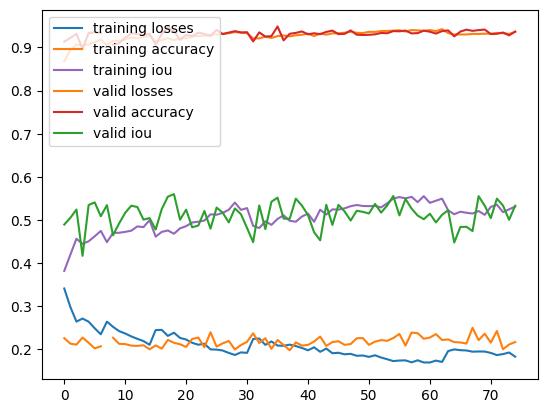

None

In [ ]:
import os
from IPython.display import display
import matplotlib.pyplot as plt
import json

RUNNAME = 'finetune_LC_CL_256_39_withBN_with_all_data'

max_valid_iou = 0
start = 0

epochs = []
training_losses = []
training_accuracies = []
training_ious = []
valid_losses = []
valid_accuracies = []
valid_ious = []

for i in range(start, 100):
  train_validation_loop(net, optimizer, scheduler, train_loader, valid_loader, 10, i)
  epochs.append(i)
  x = epochs
  if i % 10 == 0:
    save_base_path = '/content/drive/MyDrive/Uni/TUB/Semester/5 - Masterarbeit/models/finetune/'
    #save_path = os.path.join("checkpoints", "{}_{}_{}.cp".format(RUNNAME, i, iou.item()))
    save_path = save_base_path + '{}_{}_{}.cp'.format(RUNNAME, i, max_valid_iou.item())
    torch.save(net.state_dict(), save_path)

    # Ensure data for plotting is on CPU and in numpy format
  training_losses_np = [loss.item() for loss in training_losses]  # Assuming losses are tensors
  training_accuracies_np = [acc.item() for acc in training_accuracies]  # Same assumption
  training_ious_np = [iou.item() for iou in training_ious]
  valid_losses_np = [loss.item() for loss in valid_losses]
  valid_accuracies_np = [acc.item() for acc in valid_accuracies]
  valid_ious_np = [iou.item() for iou in valid_ious]

  if i % 10 == 0:
      with open(f'/content/drive/MyDrive/Uni/TUB/Semester/5 - Masterarbeit/models/finetune/{RUNNAME}.json', 'w') as f:
        json.dump({'training_losses_np': training_losses_np,
                  'training_accuracies_np': training_accuracies_np,
                  'training_ious_np': training_ious_np,
                  'valid_losses_np': valid_losses_np,
                  'valid_accuracies_np': valid_accuracies_np,
                  'valid_ious_np': valid_ious_np,}, f)

  plt.plot(x, training_losses_np, label='training losses')
  plt.plot(x, training_accuracies_np, 'tab:orange', label='training accuracy')
  plt.plot(x, training_ious_np, 'tab:purple', label='training iou')
  plt.plot(x, valid_losses_np, label='valid losses')
  plt.plot(x, valid_accuracies_np, 'tab:red', label='valid accuracy')
  plt.plot(x, valid_ious_np, 'tab:green', label='valid iou')
  plt.legend(loc="upper left")
  #plt.show()  # Optionally, show plot after updating each time

  # plt.plot(x, training_losses, label='training losses')
  # plt.plot(x, training_accuracies, 'tab:orange', label='training accuracy')
  # plt.plot(x, training_ious, 'tab:purple', label='training iou')
  # plt.plot(x, valid_losses, label='valid losses')
  # plt.plot(x, valid_accuracies, 'tab:red',label='valid accuracy')
  # plt.plot(x, valid_ious, 'tab:green',label='valid iou')
  # plt.legend(loc="upper left")

  display(plt.show())

  print("max valid iou:", max_valid_iou)

# save the model at the end as well, the one with highest iou
save_base_path = '/content/drive/MyDrive/Uni/TUB/Semester/5 - Masterarbeit/models/finetune/'
save_path = save_base_path + '{}_{}_{}.cp'.format(RUNNAME, 'final', max_valid_iou.item())
torch.save(net.state_dict(), save_path)

In [ ]:
# Save all the metrics to a file
import json
with open(f'/content/drive/MyDrive/Uni/TUB/Semester/5 - Masterarbeit/models/finetune/{RUNNAME}.json', 'w') as f:
    json.dump({'training_losses_np': training_losses_np,
               'training_accuracies_np': training_accuracies_np,
               'training_ious_np': training_ious_np,
               'valid_losses_np': valid_losses_np,
               'valid_accuracies_np': valid_accuracies_np,
               'valid_ious_np': valid_ious_np,}, f)

## Evaluate

there is an entire notebook just for evaluation, but this turned out to be more covenient, as the data was already loaded into memory




In [ ]:
# load the model from teh epoch you want to evaluate:

net = smp.Unet(encoder_name="resnet18", encoder_weights=None, in_channels = 2, classes= 2)

def convertBNtoGN(module, num_groups=16):
  """
  this was included from senfloods creators.
  possible explanation:
    GroupNorm was introduced as an alternative to BatchNorm, especially beneficial for cases where the batch size is small (in our case: 16).
    GroupNorm divides the channels into groups and computes the mean and standard deviation within these groups for normalization.
  """
  if isinstance(module, torch.nn.modules.batchnorm.BatchNorm2d):
    return nn.GroupNorm(num_groups, module.num_features,
                        eps=module.eps, affine=module.affine)
    if module.affine:
        mod.weight.data = module.weight.data.clone().detach()
        mod.bias.data = module.bias.data.clone().detach()

  for name, child in module.named_children():
      module.add_module(name, convertBNtoGN(child, num_groups=num_groups))

  return module

net = convertBNtoGN(net)

# this is to retrieve
model_save_path = '/content/drive/MyDrive/Uni/TUB/Semester/5 - Masterarbeit/models/finetune/'
checkpoints = os.listdir(model_save_path)
state_dict = torch.load(model_save_path + 'finetune_BUILT_CL_128_59_withGN_with_all_data_50_0.5454703569412231.cp') # finetune_BUILT_CL_256_74_withGN_with_all_data_50_0.5673146843910217 / finetune_BUILT_CL_256_74_withBN_with_all_data_50_0.5567578673362732
net.load_state_dict(state_dict)

<All keys matched successfully>

In [ ]:
# load the test data

!gsutil cp gs://sen1floods11/v1.1/splits/flood_handlabeled/flood_bolivia_data.csv .

Copying gs://sen1floods11/v1.1/splits/flood_handlabeled/flood_bolivia_data.csv...
- [1 files][  834.0 B/  834.0 B]                                                
Operation completed over 1 objects/834.0 B.                                      


In [ ]:
def load_flood_test_data(input_root, label_root):
  fname = "flood_test_data.csv"
  testing_files = []
  with open(fname) as f:
    for line in csv.reader(f):
      testing_files.append(tuple((input_root+line[0], label_root+line[1])))

  return download_flood_water_data_from_list(testing_files)

def load_flood_bolivia_data(input_root, label_root):
  fname = "flood_bolivia_data.csv"
  testing_files = []
  with open(fname) as f:
    for line in csv.reader(f):
      testing_files.append(tuple((input_root+line[0], label_root+line[1])))

  return download_flood_water_data_from_list(testing_files)

In [ ]:
test_data = load_flood_test_data('S1/', 'Labels/')
test_dataset = InMemoryDataset(test_data, processTestIm)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=4, shuffle=True, sampler=None,
                  batch_sampler=None, num_workers=0, collate_fn=lambda x: (torch.cat([a[0] for a in x], 0), torch.cat([a[1] for a in x], 0)),
                  pin_memory=True, drop_last=False, timeout=0,
                  worker_init_fn=None)
test_iter = iter(test_loader)

S1/Ghana_313799_S1Hand.tif Labels/Ghana_313799_LabelHand.tif


In [ ]:
bolivia_data = load_flood_bolivia_data('S1/', 'Labels/')
bolivia_dataset = InMemoryDataset(bolivia_data, processTestIm)
bolivia_loader = torch.utils.data.DataLoader(bolivia_dataset, batch_size=4, shuffle=True, sampler=None,
                  batch_sampler=None, num_workers=0, collate_fn=lambda x: (torch.cat([a[0] for a in x], 0), torch.cat([a[1] for a in x], 0)),
                  pin_memory=True, drop_last=False, timeout=0,
                  worker_init_fn=None)
bolivia_iter = iter(bolivia_loader)

S1/Bolivia_103757_S1Hand.tif Labels/Bolivia_103757_LabelHand.tif


In [ ]:
# metrics to calculate here:

def computeIOU(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()

  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  intersection = torch.sum(output * target)
  union = torch.sum(target) + torch.sum(output) - intersection
  iou = (intersection + .0000001) / (union + .0000001)

  if iou != iou:
    print("failed, replacing with 0")
    iou = torch.tensor(0).float()

  return iou

def computeAccuracy(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()

  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  correct = torch.sum(output.eq(target))

  return correct.float() / len(target)

def truePositives(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()
  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  correct = torch.sum(output * target)

  return correct

def trueNegatives(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()
  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  output = (output == 0)
  target = (target == 0)
  correct = torch.sum(output * target)

  return correct

def falsePositives(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()
  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  output = (output == 1)
  target = (target == 0)
  correct = torch.sum(output * target)

  return correct

def falseNegatives(output, target):
  output = torch.argmax(output, dim=1).flatten()
  target = target.flatten()
  no_ignore = target.ne(255).cuda()
  output = output.masked_select(no_ignore)
  target = target.masked_select(no_ignore)
  output = (output == 0)
  target = (target == 1)
  correct = torch.sum(output * target)

  return correct

In [ ]:
from matplotlib.colors import ListedColormap

colors = plt.cm.viridis(np.linspace(0, 1, 81))  # Using 'viridis' for demonstration
cmap_sar = ListedColormap(colors)

In [ ]:
from torchvision.transforms.functional import to_pil_image
def visualize_segmentation_example_within_loop(images, labels):
  images, labels = images.cuda(), labels.cuda()

  # Obtain the model's predictions.
  outputs = net(images)
  # Assuming the outputs are raw logits, apply softmax to obtain probabilities.
  probs = torch.softmax(outputs, dim=1)
  # Convert probabilities to predicted class labels.
  predicted_masks = torch.argmax(probs, dim=1)

  # Move the tensors to the CPU for visualization.
  images, labels, predicted_masks = images.cpu(), labels.cpu(), predicted_masks.cpu()

  # Convert the first image and masks to PIL images for easy visualization.
  original_image = to_pil_image(images[0])
  true_mask = to_pil_image(labels[0].unsqueeze(0).float())  # Adding channel dimension for compatibility.
  predicted_mask = to_pil_image(predicted_masks[0].unsqueeze(0).byte())
  print(predicted_mask.size)

  # Visualization
  fig, ax = plt.subplots(1, 3, figsize=(20, 10))
  ax[0].imshow(images[0][0], cmap=cmap_sar, vmin=-4, vmax=4)
  ax[0].set_title('Original Image Band 1')
  ax[0].axis('off')

  ax[1].imshow(true_mask)
  ax[1].set_title('True Mask')
  ax[1].axis('off')

  ax[2].imshow(predicted_mask)
  ax[2].set_title('Predicted Mask')
  ax[2].axis('off')

  plt.show()

In [ ]:
RUNNAME = 'finetune_LC_CL_256_39_withGN_with_all_data'

In [ ]:
from tqdm import tqdm_notebook as tqdm
import json

def test_loop(test_data_loader, net, bolivia_used):
  net = net.eval()
  net = net.cuda()
  count = 0
  iou = 0
  loss = 0
  accuracy = 0
  tp = 0
  fp = 0
  tn = 0
  fn = 0
  with torch.no_grad():
      for (images, labels) in tqdm(test_data_loader):
          net = net.cuda()
          outputs = net(images.cuda())
          valid_iou = computeIOU(outputs, labels.cuda())
          iou += valid_iou
          accuracy += computeAccuracy(outputs, labels.cuda())
          tp +=  truePositives(outputs, labels.cuda())
          fp +=  falsePositives(outputs, labels.cuda())
          tn +=  trueNegatives(outputs, labels.cuda())
          fn +=  falseNegatives(outputs, labels.cuda())
          count += 1
          visualize_segmentation_example_within_loop(images, labels)

  iou = iou / count
  print("Test Mean IOU:", iou)
  print("Total IOU:", (tp.float() / (fn + fp + tp)))
  print("OMISSON:", fn.float() / (fn + tp))
  print("COMMISSON:", fp.float() / (tn + fp))
  print("Test Accuracy:", accuracy / count)

  with open(f'/content/drive/MyDrive/Uni/TUB/Semester/5 - Masterarbeit/models/finetune/{RUNNAME}_evaluation_{bolivia_used}.json', 'w') as f:
    json.dump({'mean iou': iou.item(),
               'count': count,
               'accuracy (has to be divided by count)': accuracy.item(),
               'tp': tp.item(),
               'fp': fp.item(),
               'tn': tn.item(),
               'fn': fn.item()}, f)

<ipython-input-36-488753d81d4e>:16: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for (images, labels) in tqdm(test_data_loader):


  0%|          | 0/23 [00:00<?, ?it/s]

(256, 256)


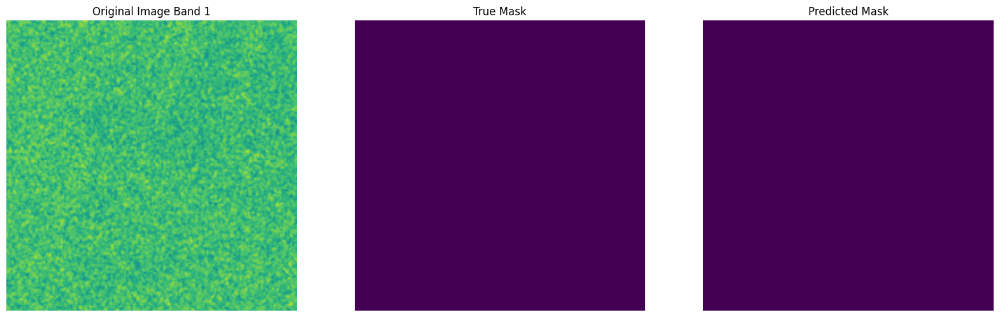

(256, 256)


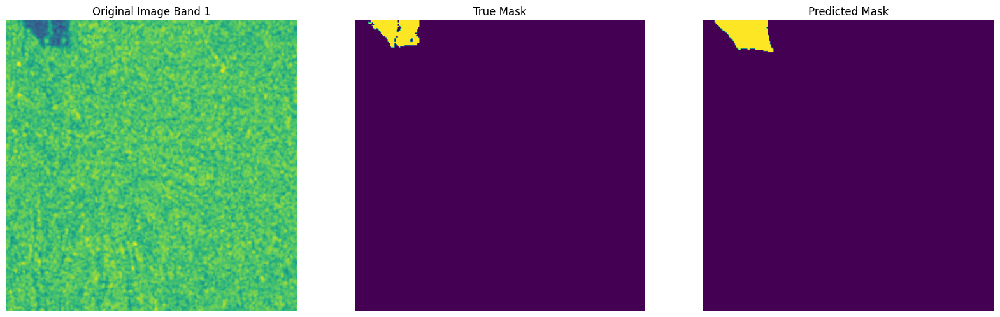

(256, 256)


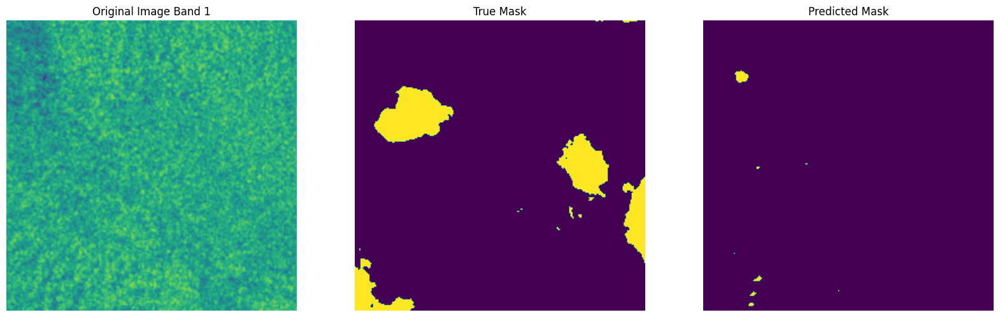

(256, 256)


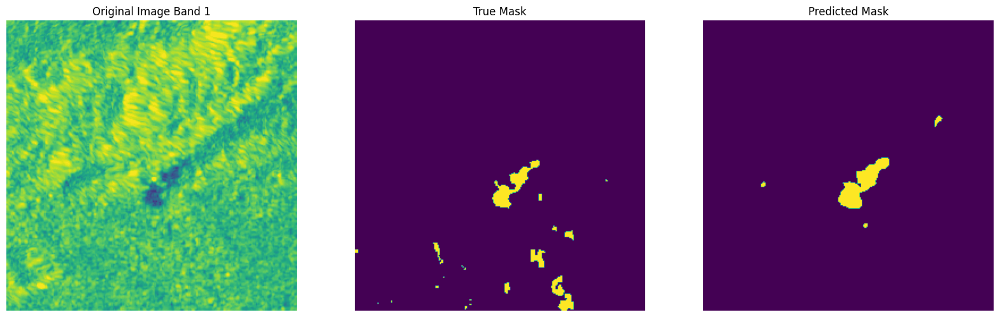

(256, 256)


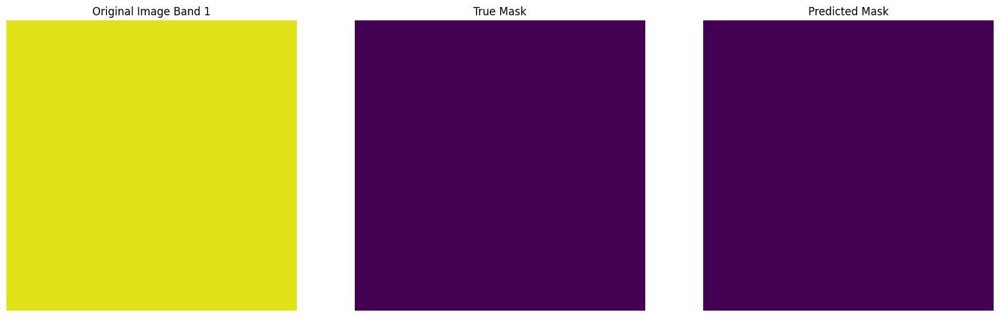

(256, 256)


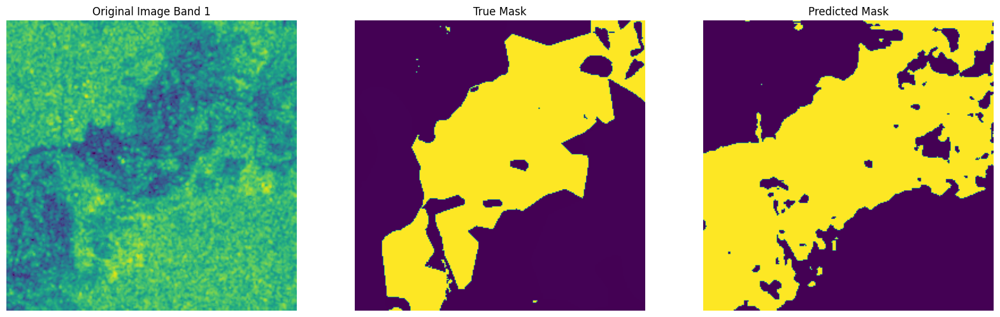

(256, 256)


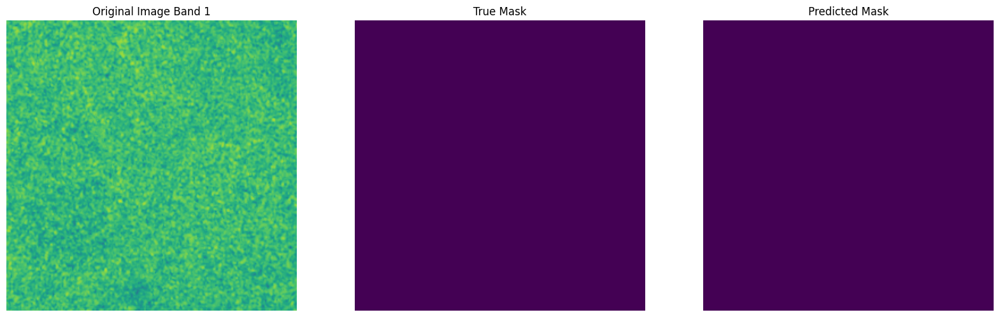

(256, 256)


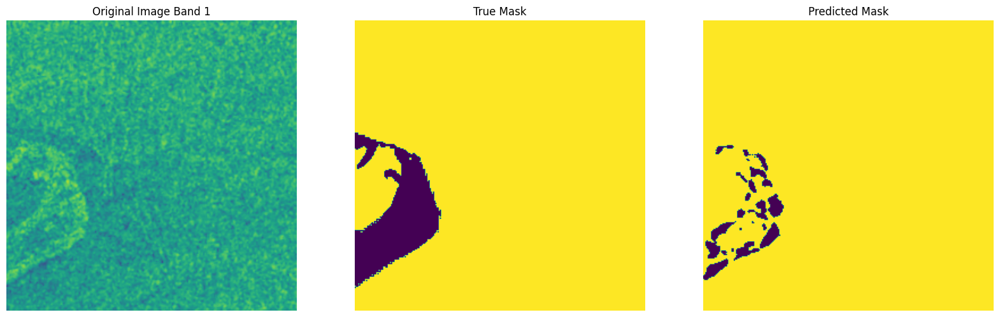

(256, 256)


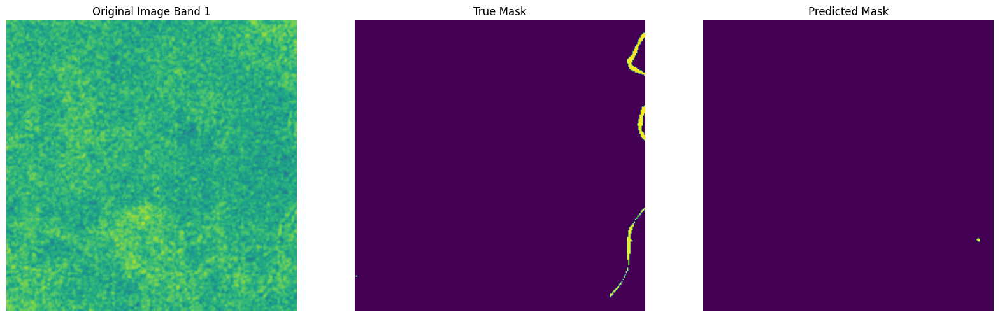

(256, 256)


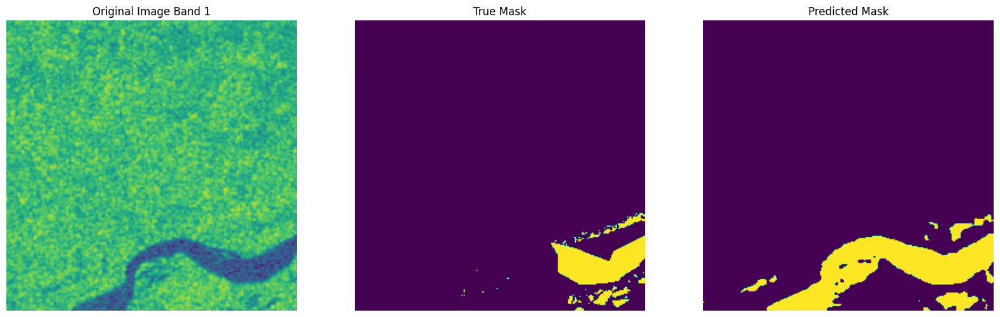

(256, 256)


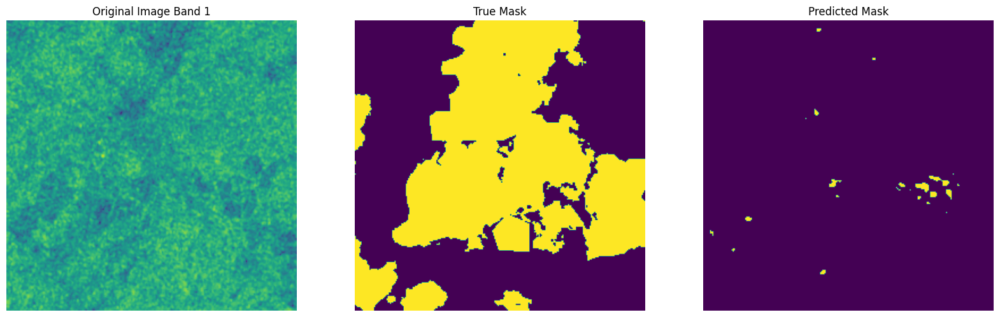

(256, 256)


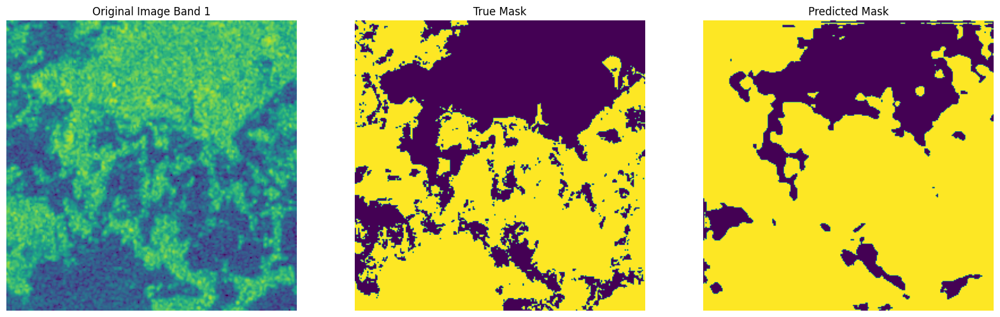

(256, 256)


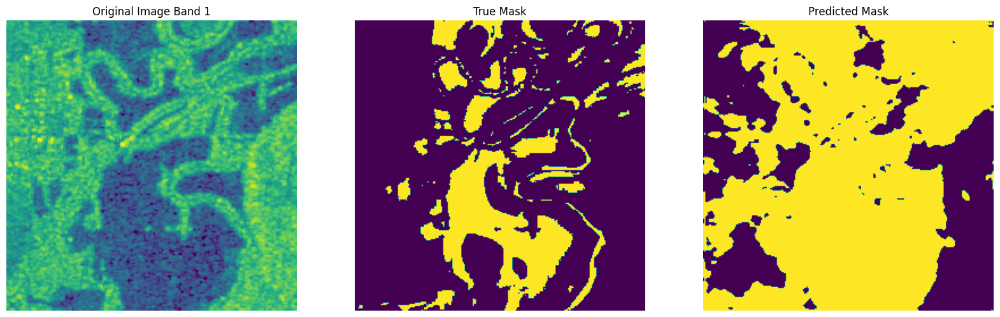

(256, 256)


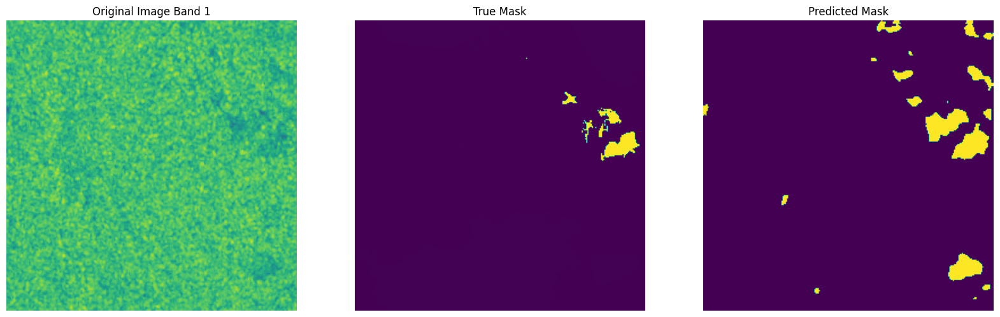

(256, 256)


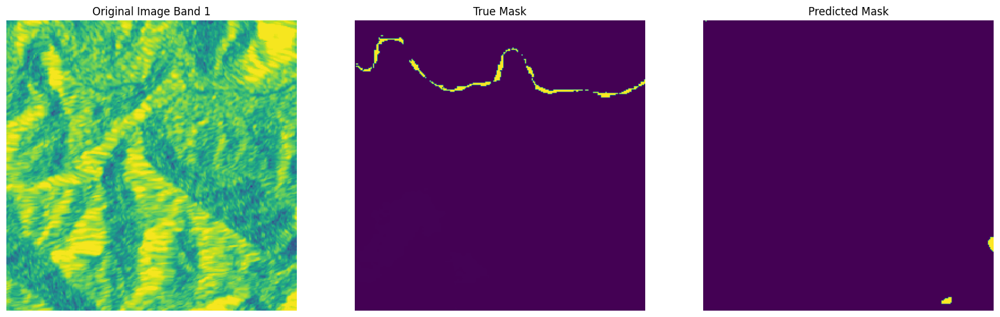

(256, 256)


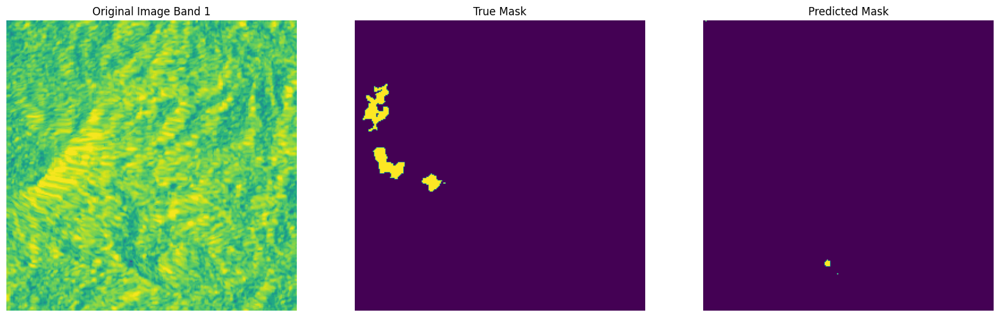

(256, 256)


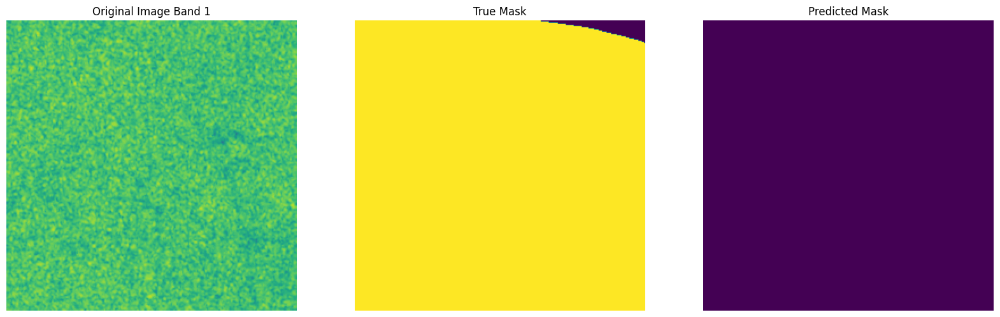

(256, 256)


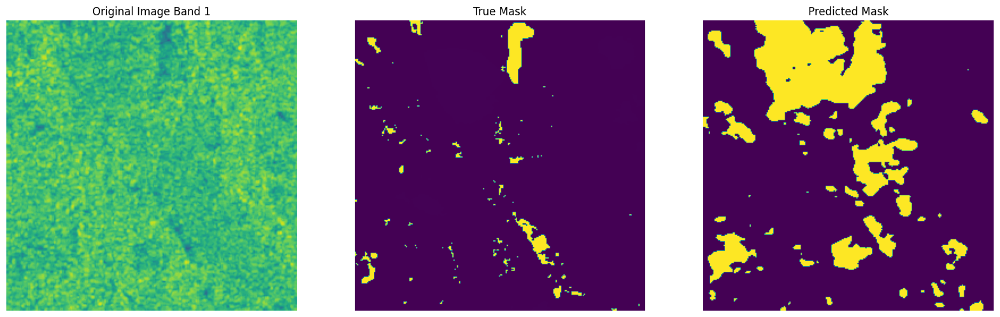

(256, 256)


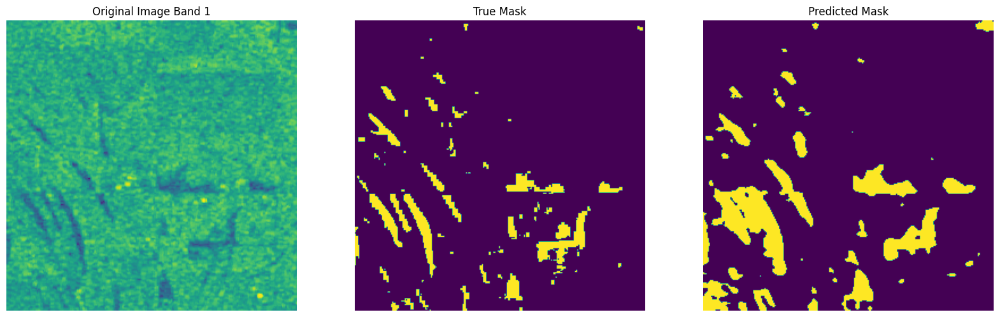

(256, 256)


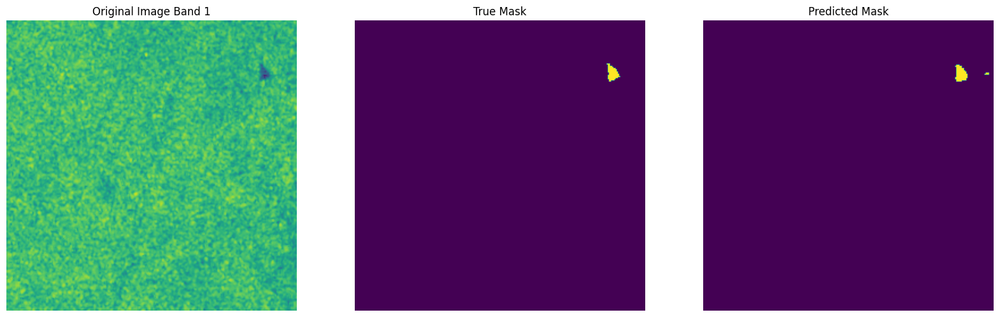

(256, 256)


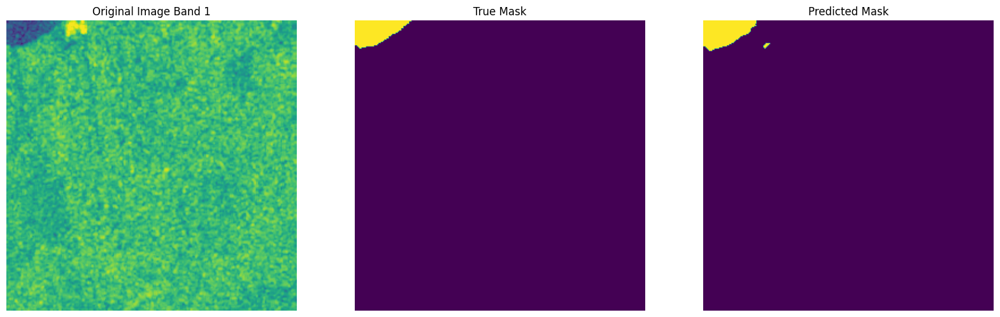

(256, 256)


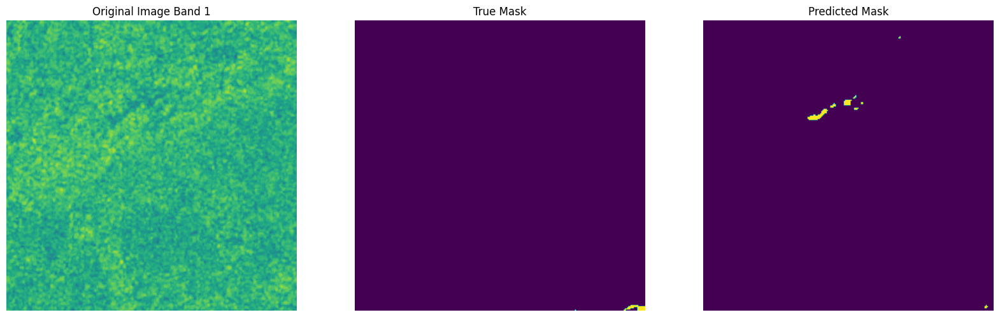

(256, 256)


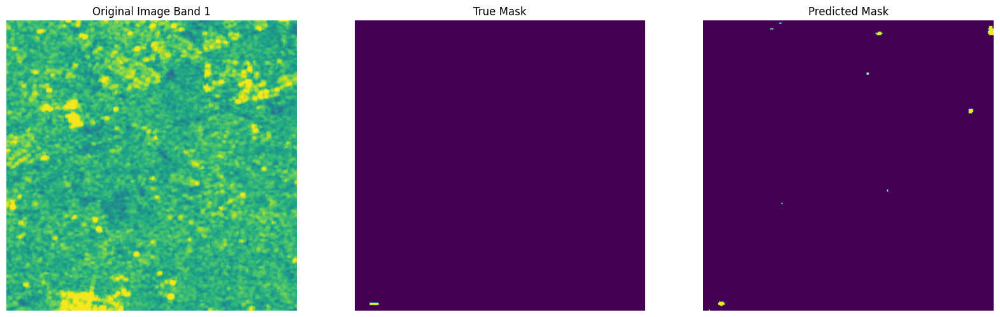

Test Mean IOU: tensor(0.4923, device='cuda:0')
Total IOU: tensor(0.5773, device='cuda:0')
OMISSON: tensor(0.1824, device='cuda:0')
COMMISSON: tensor(0.0595, device='cuda:0')
Test Accuracy: tensor(0.9256, device='cuda:0')


In [ ]:
test_loop(test_loader, net, 'test')

<ipython-input-36-488753d81d4e>:16: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for (images, labels) in tqdm(test_data_loader):


  0%|          | 0/4 [00:00<?, ?it/s]

(256, 256)


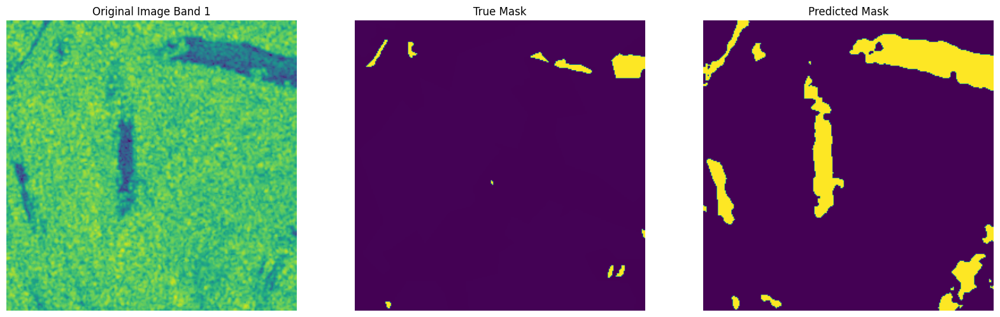

(256, 256)


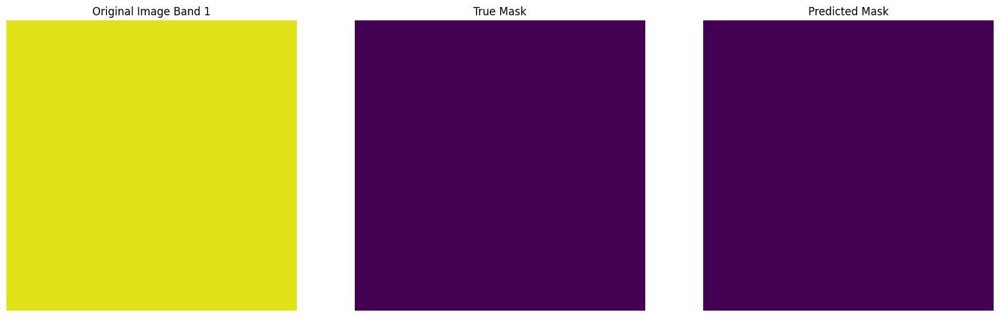

(256, 256)


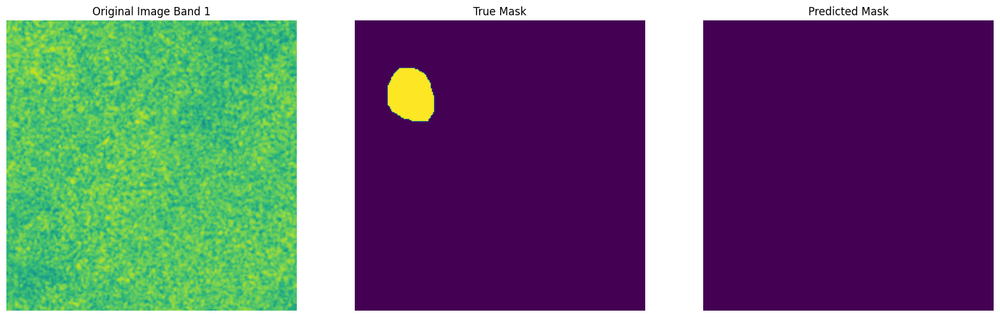

(256, 256)


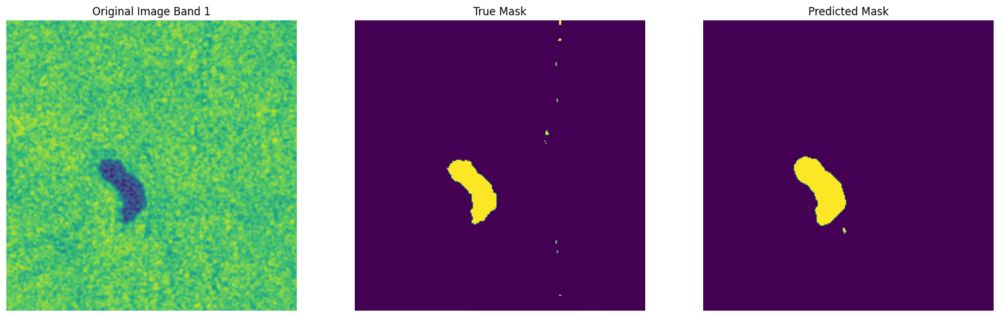

Test Mean IOU: tensor(0.4077, device='cuda:0')
Total IOU: tensor(0.4950, device='cuda:0')
OMISSON: tensor(0.2911, device='cuda:0')
COMMISSON: tensor(0.0814, device='cuda:0')
Test Accuracy: tensor(0.8829, device='cuda:0')


In [ ]:
test_loop(bolivia_loader, net, 'bolivia')